In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc, scipy.signal
%matplotlib inline
plt.rcParams['figure.figsize'] = 20,15
from IPython.core.display import HTML
HTML("<style>.container { width:80% !important; }</style>")

In [2]:
plt.viridis()
img = cv2.imread('pics/P1040712.JPG')

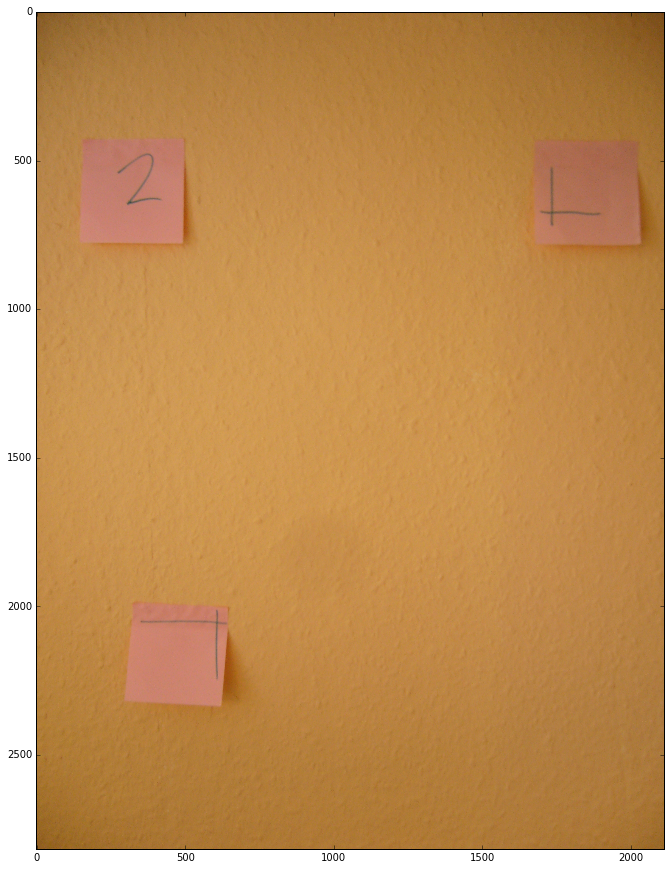

In [3]:
aimg = plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

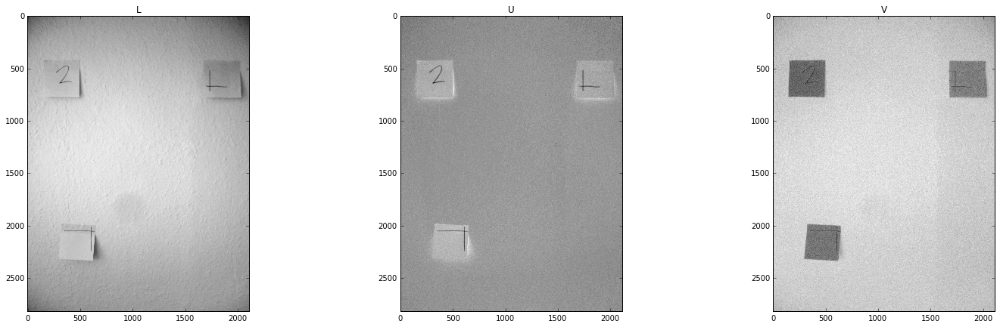

In [4]:
luv = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
fig,axes = plt.subplots(ncols=3, figsize=(25,7))
for ch, ax, t in zip((0, 1, 2), axes, 'LUV'):
    ax.imshow(luv[:,:,ch], cmap='gray')
    ax.set_title(t)

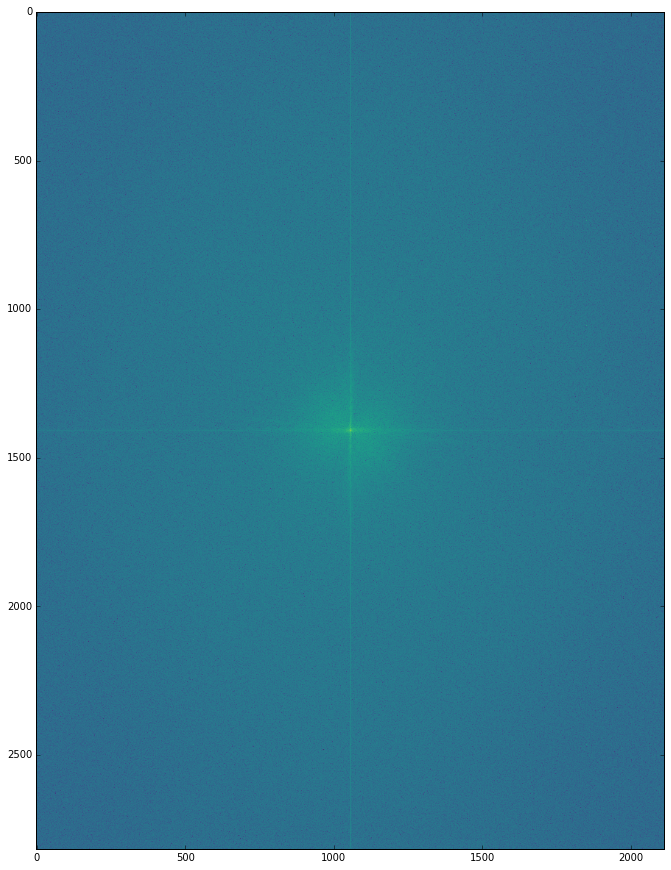

In [5]:
tf = np.fft.fft2(luv[:,:,0])
tfs = np.fft.fftshift(tf)
magspec = 20*np.log(np.abs(tfs))
plt.imshow(magspec)

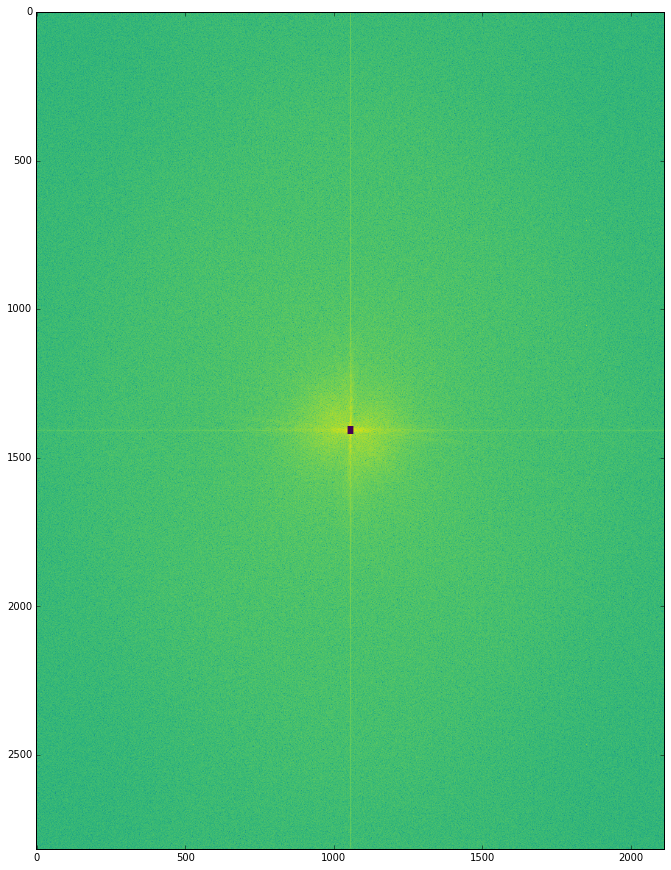

In [6]:
rows,cols   = tfs.shape
midx,midy   = cols//2, rows//2
masksize    = 0.01
maskx,masky = int(midx*masksize), int(midy*masksize)
#tfs[:midx-maskx] = 0
#tfs[midx+maskx:] = 0
#tfs[midx-maskx:midx+maskx, :midy-masky] = 0
#tfs[midx-maskx:midx+maskx, midy+masky:] = 0
tfs[midy-masky:midy+masky, midx-maskx:midx+maskx] = 0.001
magspec = 20*np.log(np.abs(tfs))
#midx, midy, maskx, masky
plt.imshow(magspec)

In [7]:
tfis = np.fft.ifftshift(tfs)
tfi = np.fft.ifft2(tfis)
img_proc = np.abs(tfi)

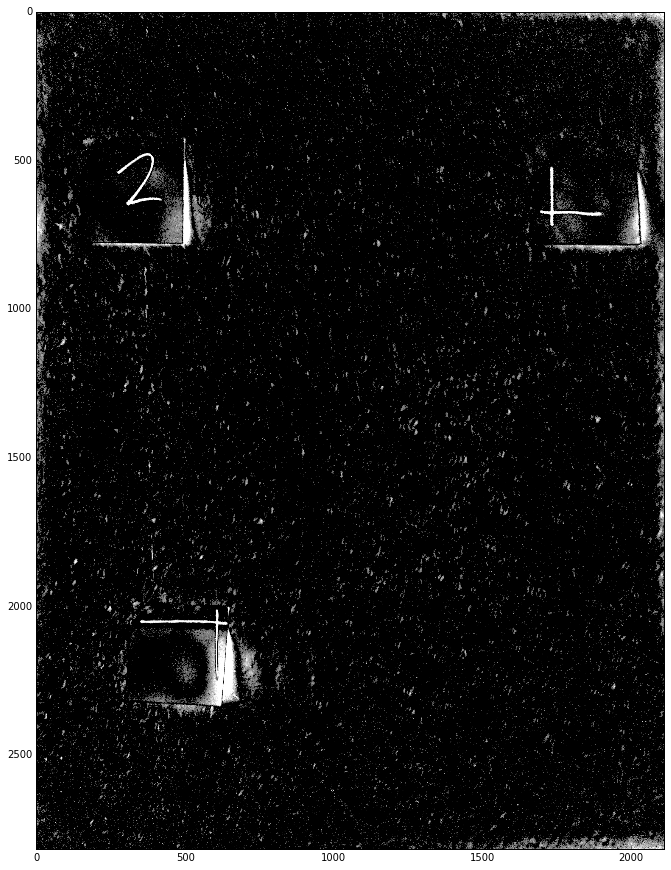

In [8]:
img_proc[img_proc > 15] = 15
img_proc[img_proc < 5] = 0
plt.imshow(img_proc, cmap='gray')

In [9]:
#p = cv2.SimpleBlobDetector_Params()
#p.filterByArea = True
#p.minArea = 3

#det = cv2.SimpleBlobDetector_create(p)
#blobs = det.detect((img_proc*64).astype(np.uint8))
#annotated = cv2.drawKeypoints((img_proc*32).astype(np.uint8), blobs, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
#det = cv2.SimpleBlobDetector_create(p)
#blobs = det.detect(luv[:,:,0])
#annotated = cv2.drawKeypoints(luv[:,:,0], blobs, np.array([]), (255,0,0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
#plt.imshow(annotated)

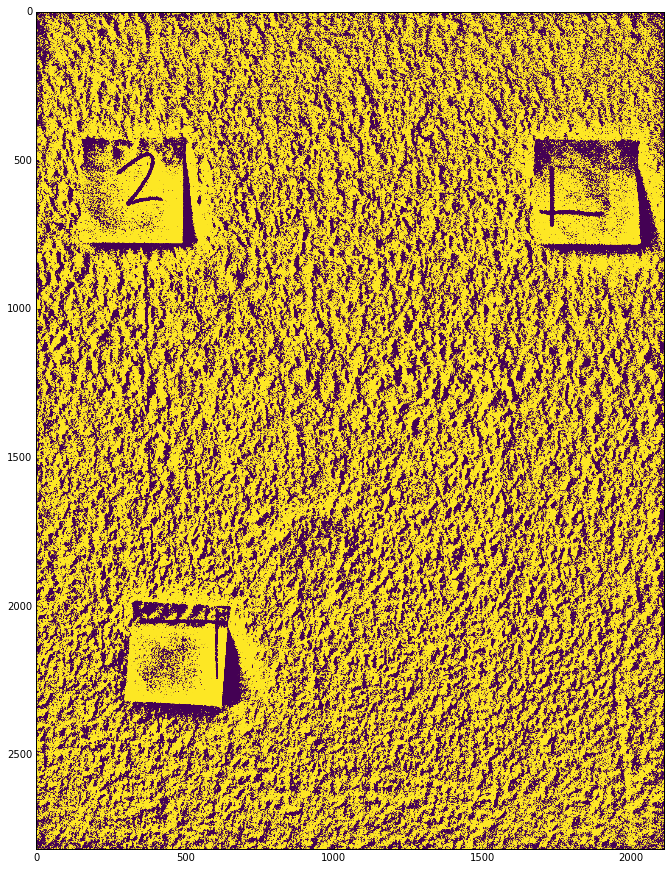

In [10]:
ath = cv2.adaptiveThreshold(luv[:,:,0], 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY,257, 1)
plt.imshow(ath)

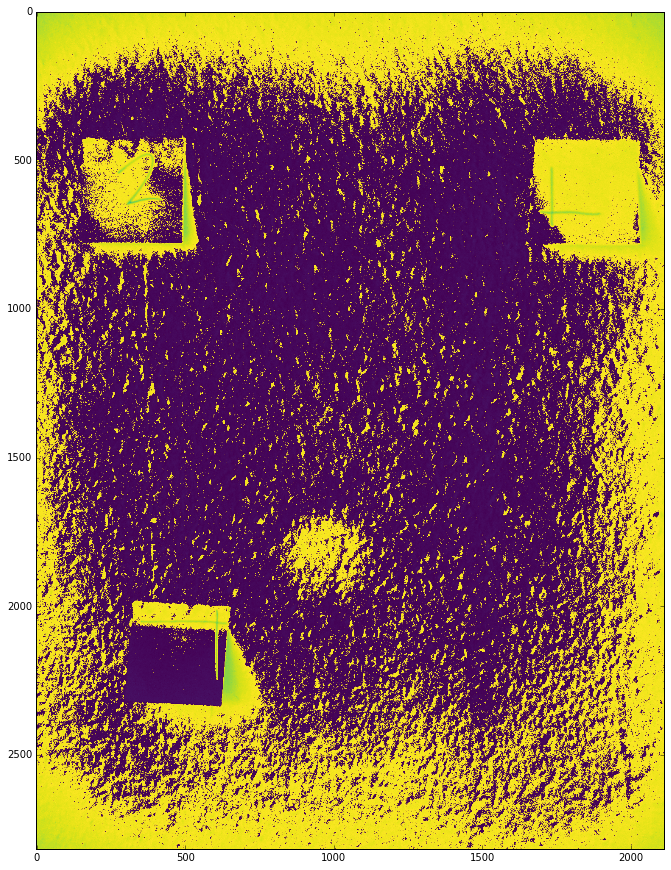

In [11]:
blurred = cv2.blur(luv[:,:,0], (1023,1023))

flt = luv[:,:,0] - blurred
plt.imshow(flt)

In [12]:
import pywt
# ['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8', 'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17', 'sym18', 'sym19', 'sym20']
wavelet = 'coif1'
levels  = 8
cA, *coeffs = cA8, *restlvl, (cH2, cV2, cD2), (cH1, cV1, cD1) = pywt.wavedec2(luv[:,:,0].astype(np.float64)/256, wavelet, level=levels)

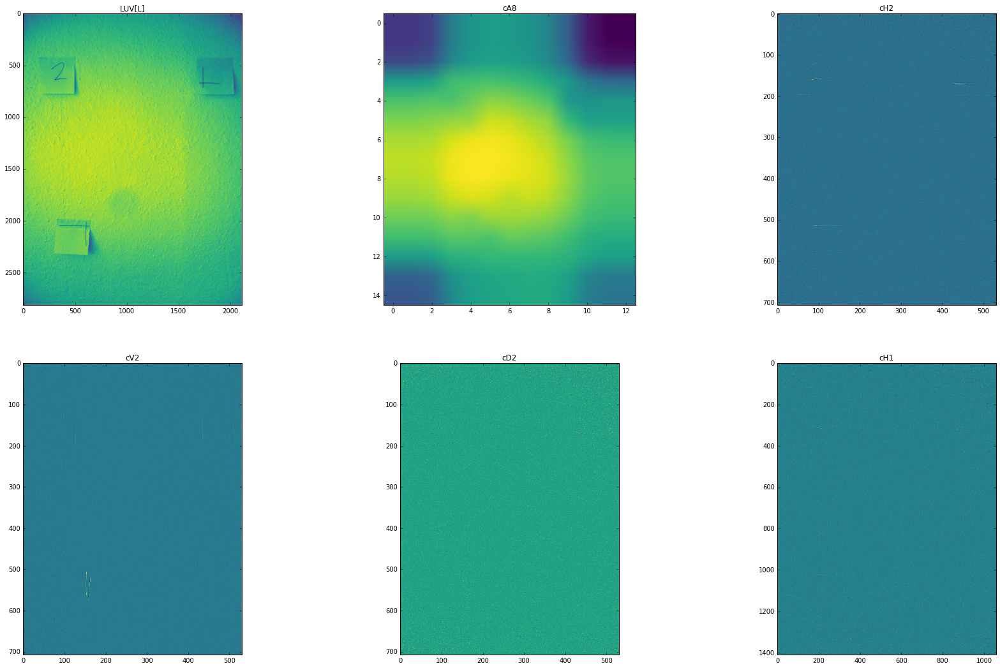

In [13]:

fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(30,18))

for ax, (t, img) in zip(axes.ravel(), [
    ('LUV[L]', luv[:,:,0].astype(np.float64)/256),
    ('cA8', cA8),
    ('cH2', cH2),
    ('cV2', cV2),
    ('cD2', cD2),
    ('cH1', cH1)]):
    ax.set_title(t)
    ax.imshow(img)

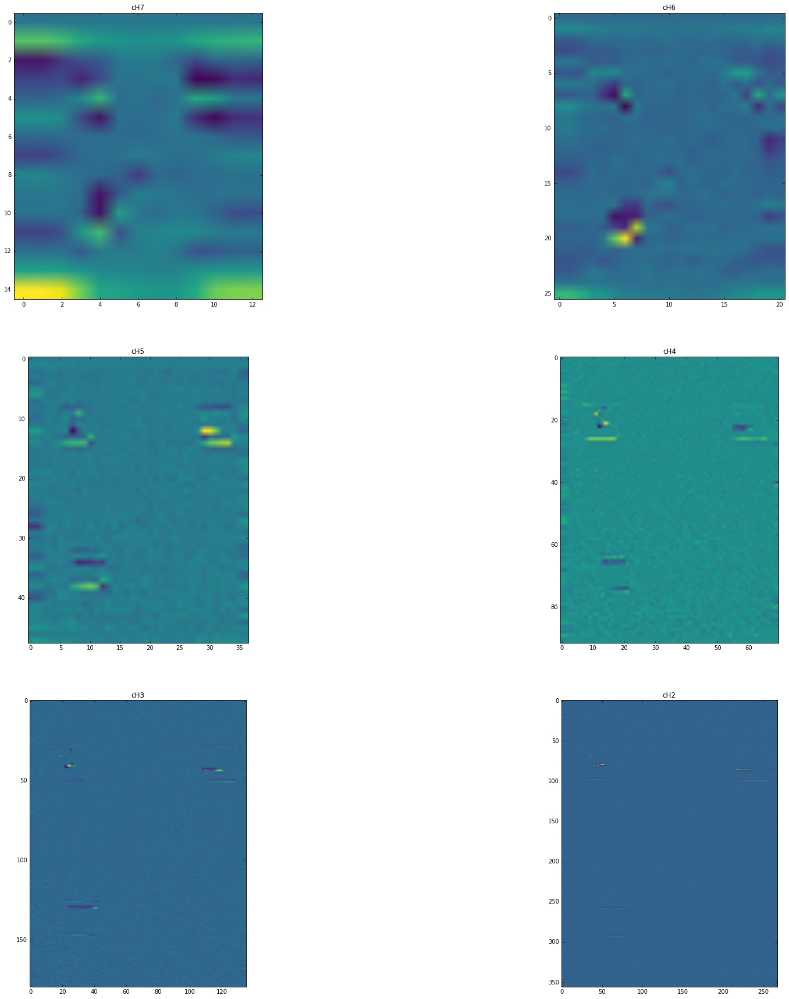

In [14]:
fig, axes = plt.subplots(ncols=2, nrows=3, figsize=(30,30))

for i, ax, (dH, dV, dD) in zip(range(levels-1, -1, -1), axes.ravel(), restlvl):
    ax.set_title('cH{}'.format(i))
    ax.imshow(dH)

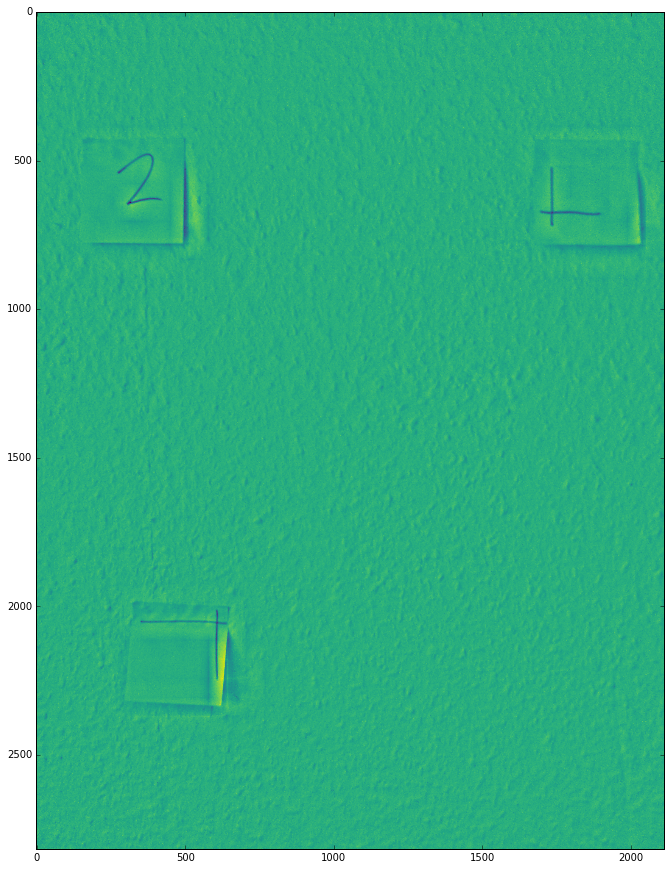

In [15]:
ncoeffs = []
for i, (cH, cV, cD) in enumerate(coeffs):
    if i in [0, 1]:
        ncH = np.zeros(cH.shape, dtype=np.float64)
        ncV = np.zeros(cV.shape, dtype=np.float64)
        ncD = np.zeros(cD.shape, dtype=np.float64)
        nc = ncH, ncV, ncD
    else:
        nc = cH, cV, cD
    ncoeffs.append(nc)

ncA = np.zeros(cA.shape, dtype=np.float64)

l_rec = pywt.waverec2([ncA, *ncoeffs], wavelet)
plt.imshow(l_rec)
scipy.misc.imsave('/tmp/scipy-ipython-out.png', l_rec/0.15*256)

In [16]:
#l_rec_z = l_rec.copy()
#l_rec_z[l_rec_z > 0.1] = 0.1
#l_rec_z[l_rec_z < 0.02] = np.astype(np.uint8)
#plt.imshow(l_rec_z)

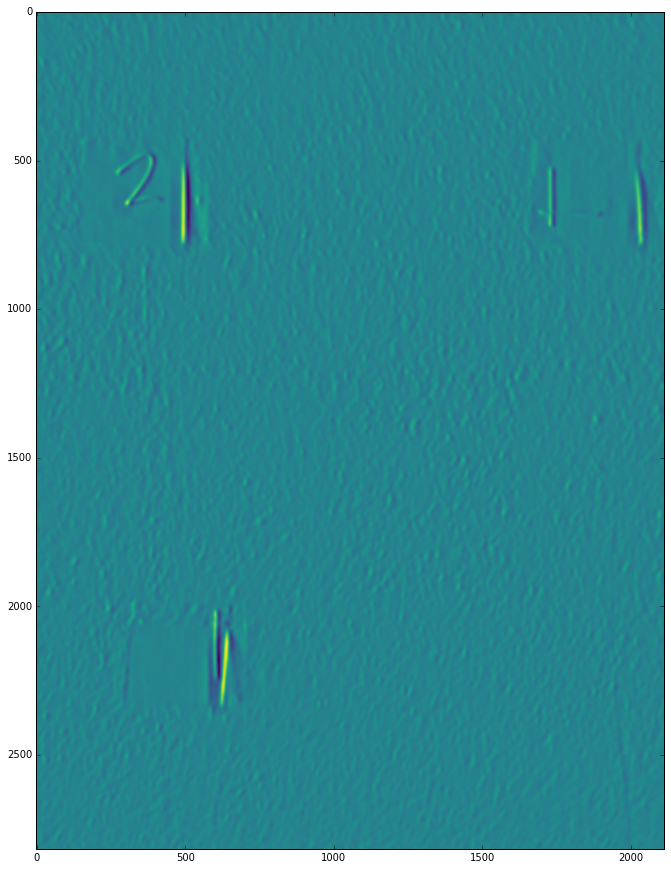

In [17]:
#lgradx, lgrady = np.gradient(l_rec)
#plt.imshow(np.abs(lgradx), vmin=0.005, vmax=0.01)
kernel_x = np.gradient(cv2.getGaussianKernel(40, -1).ravel()).reshape(-1,1)
kernel_y = cv2.getGaussianKernel(40, -1)
gflt = cv2.sepFilter2D(l_rec, -1, kernel_x, kernel_y)
plt.imshow(gflt)
scipy.misc.imsave('/tmp/ipython-gflt-out.png', gflt/np.max(gflt)*256)

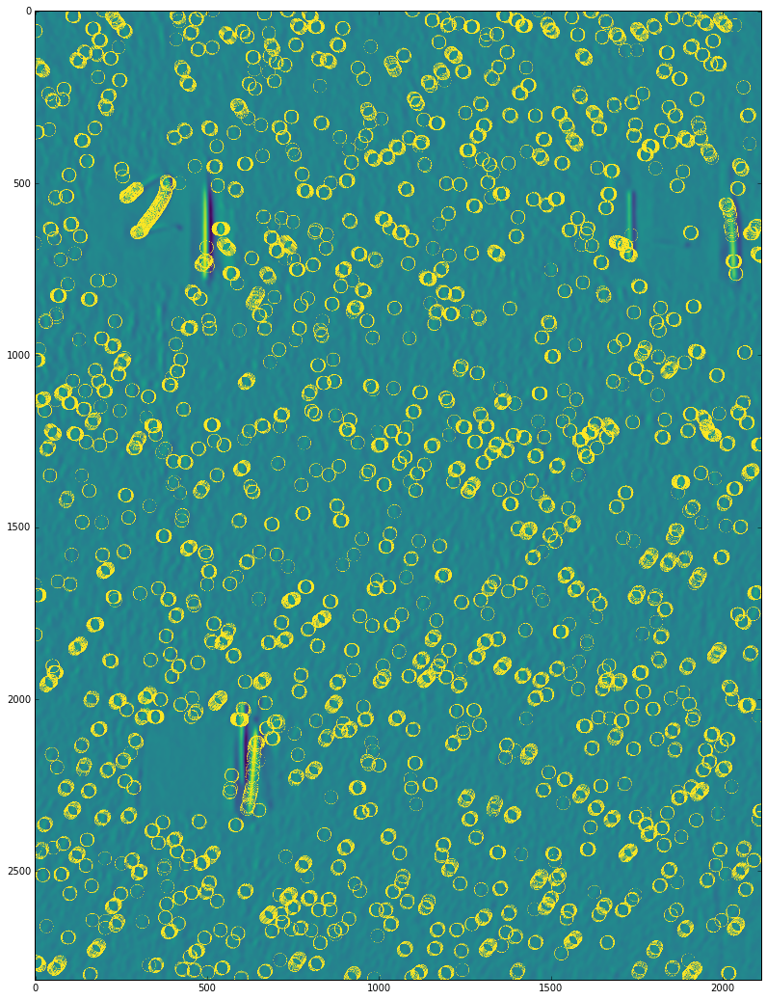

In [18]:
xs,ys = scipy.signal.argrelmax(gflt, order=500)
maximg = gflt/np.max(gflt)
for y, x in zip(xs, ys):
    cv2.circle(maximg, (x, y), 20, (1,))
_, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,18))
ax.imshow(maximg)